
# Tracking Groundtruth ADS-B Data by Simulating Radar Detections


## Introduction
Our goal in this demonstration is to plot time series data of Stone Soup's :class:`~.MultiTargetTracker`
being applied to air traffic over and surrounding the UK.
We will establish the individual components required for our tracker, including simulating radar
detection data from our groundtruth, which will be read in from a CSV file of ADS–B data sourced
from `The OpenSky Network`_ [#]_ [#]_. Finally, we will plot our tracks using the Folium plugin
`TimestampedGeoJson`_.




## Reading the CSV File
To read in our groundtruth data from a
:download:`CSV file <../../demos/OpenSky_Plane_States.csv>`, we can use Stone Soup’s
:class:`~.CSVGroundTruthReader`. To convert our longitude and latitude data to Universal
Transverse Mercator (UTM) projection, we will use :class:`~.LongLatToUTMConverter`.



In [1]:
from stonesoup.reader.generic import CSVGroundTruthReader
from stonesoup.feeder.geo import LongLatToUTMConverter
import utm

truthslonlat = CSVGroundTruthReader(
    "OpenSky_Plane_States.csv",
    state_vector_fields=("lon", "x_speed", "lat", "y_speed",
                         "geoaltitude", "vertrate"),  # List of columns names to be used in state vector
    path_id_field="icao24",                           # Name of column to be used as path ID
    time_field="time",                                # Name of column to be used as time field
    timestamp=True)                                   # Treat time field as a timestamp from epoch


groundtruth = LongLatToUTMConverter(truthslonlat, zone_number=30,  mapping=[0, 2])

## Constructing Sensors
Now we will assemble our sensors used in this demonstration. We’ll introduce 2 stationary radar
sensors, and also demonstrate Stone Soup’s ability to model moving sensors.

We will use :class:`~.RadarElevationBearingRange` to establish our radar sensors.
:class:`~.RadarElevationBearingRange` allows us to generate measurements of targets by using
a :class:`~.CartesianToElevationBearingRange` model. We proceed to create a :class:`~.Platform`
for each stationary sensor, and append these to our list of all platforms.

Our moving sensor will be created similarly to the stationary case. We will need to
make a movement controller to control the platform's movement, this is done by creating
transition models, as well as setting transition times.

:class:`~.PlatformDetectionSimulator` will then proceed to generate our detection data from
the groundtruth (calls each sensor in platforms).



In [2]:
import datetime
import numpy as np

from stonesoup.types.array import StateVector
from stonesoup.sensor.radar import RadarElevationBearingRange
from stonesoup.types.state import State
from stonesoup.platform.base import FixedPlatform, MultiTransitionMovingPlatform
from stonesoup.simulator.platform import PlatformDetectionSimulator
from stonesoup.models.transition.linear import CombinedLinearGaussianTransitionModel,\
    ConstantVelocity, KnownTurnRate

# Create locations for reference later

# Using Heathrow as origin
*heathrow, utm_zone, _ = utm.from_latlon(51.47, -0.4543)
# Use heathrow utm grid num as reference number for utm conversions later
manchester = utm.from_latlon(53.35, -2.280, utm_zone)


# Create transition models for moving platforms
transition_modelStraight = CombinedLinearGaussianTransitionModel((ConstantVelocity(0.01),
                                                                  ConstantVelocity(0.01),
                                                                  ConstantVelocity(0.01)))

transition_modelLeft = CombinedLinearGaussianTransitionModel((KnownTurnRate((0.01, 0.01),
                                                              np.radians(3)), ConstantVelocity(0.01)))


# Create specific transition model for example moving platform
transition_models = [transition_modelStraight,
                     transition_modelLeft]
transition_times = [datetime.timedelta(seconds=160),
                    datetime.timedelta(seconds=20)]


# List sensors in stationary platforms
np.random.seed(2)

stationarySensors = [
    RadarElevationBearingRange(
        ndim_state=6,
        position_mapping=(0, 2, 4),
        noise_covar=np.diag([np.radians(0.85)**2, np.radians(3.5)**2, 100**2]),
        max_range=1*111120),

    RadarElevationBearingRange(
        ndim_state=6,
        position_mapping=(0, 2, 4),
        noise_covar=np.diag([np.radians(0.85)**2, np.radians(3.5)**2, 100**2]),
        max_range=1*111120)
    ]

# List sensors in moving platform
movingPlatformSensors = [
    RadarElevationBearingRange(
        ndim_state=6,
        position_mapping=(0, 2, 4),
        noise_covar=np.diag([np.radians(0.85)**2, np.radians(3.5)**2, 100**2]), # 
        max_range=1*111120)
    ]

platforms = []

# Create a platform for each stationary sensor and add to list of platforms
for sensor, platformLocation in zip(stationarySensors, (heathrow, manchester)):
    platformState = State([[platformLocation[0]], [0], [platformLocation[1]], [0], [0], [0]])
    platform = FixedPlatform(platformState, (0, 2, 4), sensors=[sensor])
    platforms.append(platform)

# Create moving platform
movingPlatformInitialLocation = utm.from_latlon(52.25, -0.9, utm_zone)
movingPlatformState = State([[movingPlatformInitialLocation[0]], [0],
                             [movingPlatformInitialLocation[1]], [250], [5000], [0]])
movingPlatforms = [MultiTransitionMovingPlatform(movingPlatformState,
                                                 position_mapping=(0, 2, 4),
                                                 transition_models=transition_models,
                                                 transition_times=transition_times,
                                                 sensors=movingPlatformSensors)]

# Add moving platform to list of platforms
platforms.extend(movingPlatforms)

# Simulate platform detections
detection_sim = PlatformDetectionSimulator(groundtruth, platforms)

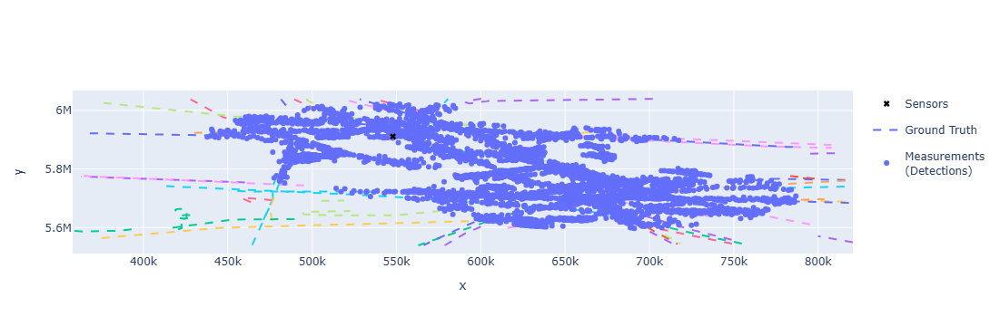

In [3]:
detections = set()
truths = set()

from itertools import tee

detection_sim, *detectors = tee(detection_sim, 3)

for time, detects in detection_sim:
    detections |= detects
    truths |= groundtruth.groundtruth_paths

from stonesoup.plotter import Plotterly

plotter = Plotterly()
plotter.plot_ground_truths(truths, [0, 2])
plotter.plot_measurements(detections, [0, 2])
plotter.plot_sensors(sensor)
plotter.fig

## Individual Components
Now it's time to set up our individual components needed to construct our initiator, and
ultimately our :class:`~.MultiTargetTracker`. We will be using the Extended Kalman Filter
since our sensor model, :class:`~.CartesianToElevationBearingRange`, is not linear.

To produce our linear transition model, we combine multiple one dimensional models into one
singular model. Notice how we specify a different transition model for our initiator. We then
pass these transition models to their respective predictors.
The update step calculates the posterior state estimate by using both our prediction and
sensor measurement. We don't need to define the measurement model here since the
model :class:`~.CartesianToElevationBearingRange` is already provided in the measurements.

The :class:`~.DistanceHypothesiser` generates track predictions at detection times, and
scores each hypothesised prediction-detection pair using our set measure of :class:`~.Mahalanobis`
distance. We allocate the detections to our predicted states by using the Global Nearest Neighbour
method. The :class:`~.UpdateTimeDeleter` will identify the tracks for deletion and delete them
once the time since last update has exceeded our specified time.
By having `delete_last_pred = True`, the state that caused a track to be deleted will be deleted
(if it is a prediction).



In [4]:
transition_model = CombinedLinearGaussianTransitionModel(
    (ConstantVelocity(15), ConstantVelocity(15), ConstantVelocity(2)))
init_transition_model = CombinedLinearGaussianTransitionModel(
    (ConstantVelocity(5), ConstantVelocity(5), ConstantVelocity(2)))

from stonesoup.predictor.kalman import StochasticIntegrationPredictor
from stonesoup.predictor.kalman import ExtendedKalmanPredictor
from stonesoup.predictor.kalman import KalmanPredictor

SIF_predictor = KalmanPredictor(transition_model)
SIF_init_predictor = KalmanPredictor(transition_model)

predictor = ExtendedKalmanPredictor(transition_model)
init_predictor = ExtendedKalmanPredictor(init_transition_model)

from stonesoup.updater.kalman import StochasticIntegrationUpdater
from stonesoup.updater.kalman import ExtendedKalmanUpdater

SIF_updater = StochasticIntegrationUpdater(measurement_model=None,SIorder=3)
updater = ExtendedKalmanUpdater(measurement_model=None)

from stonesoup.hypothesiser.distance import DistanceHypothesiser
from stonesoup.measures import Mahalanobis
hypothesiser = DistanceHypothesiser(predictor, updater, Mahalanobis(), missed_distance=10)
SIF_hypothesiser = DistanceHypothesiser(SIF_predictor, SIF_updater, Mahalanobis(), missed_distance=10)

from stonesoup.dataassociator.neighbour import GNNWith2DAssignment
data_associator = GNNWith2DAssignment(hypothesiser)
SIF_data_associator = GNNWith2DAssignment(SIF_hypothesiser)

from stonesoup.deleter.time import UpdateTimeDeleter
deleter = UpdateTimeDeleter(datetime.timedelta(seconds=1*40), delete_last_pred=True)

## The Initiator
We can now create the initiator. The :class:`~.MultiMeasurementInitiator` will initiate
and hold tracks until enough detections have been associated with the track. It will then
proceed to release the tracks to the tracker.



In [5]:
from stonesoup.initiator.simple import MultiMeasurementInitiator
from stonesoup.types.state import GaussianState

initiator = MultiMeasurementInitiator(
    GaussianState(
        np.array([[0], [0], [0], [0], [0], [0]]),   # Prior State
        np.diag([15**2, 100**2, 15**2, 100**2, 15**2, 20**2])),
    measurement_model=None,
    deleter=deleter,
    data_associator=GNNWith2DAssignment(
        DistanceHypothesiser(init_predictor, updater, Mahalanobis(), missed_distance=10)),
    updater=updater,
    min_points=2
    )

SIF_initiator = MultiMeasurementInitiator(
    GaussianState(
        np.array([[0], [0], [0], [0], [0], [0]]),   # Prior State
        np.diag([15**2, 100**2, 15**2, 100**2, 15**2, 20**2])),
    measurement_model=None,
    deleter=deleter,
    data_associator=GNNWith2DAssignment(
        DistanceHypothesiser(SIF_init_predictor, SIF_updater, Mahalanobis(), missed_distance=10)),
    updater=SIF_updater,
    min_points=2
    )

## The Tracker
Next, we bring together all the components we’ve assembled to construct our :class:`~.MultiTargetTracker`.
A loop is created to generate tracks at each time interval, and store them in a set called tracks.



It's easy for us to see how many tracks we've created by checking the length of the set tracks.



METRICS MANAGER

In [6]:

from stonesoup.metricgenerator.basicmetrics import BasicMetrics

basic_EKF = BasicMetrics(generator_name='basic_EKF', tracks_key='EKF_tracks', truths_key='truths')
basic_SIF = BasicMetrics(generator_name='basic_SIF', tracks_key='SIF_tracks', truths_key='truths')

In [7]:
from stonesoup.metricgenerator.ospametric import OSPAMetric

ospa_EKF_truth = OSPAMetric(c=200, p=2, generator_name='OSPA_EKF-truth',
                            tracks_key='EKF_tracks', truths_key='truths')
ospa_SIF_truth = OSPAMetric(c=200, p=2, generator_name='OSPA_SIF-truth',
                            tracks_key='SIF_tracks', truths_key='truths')

In [8]:
from stonesoup.metricgenerator.tracktotruthmetrics import SIAPMetrics
from stonesoup.measures import Euclidean

siap_EKF_truth = SIAPMetrics(position_measure=Euclidean((0, 2)),
                             velocity_measure=Euclidean((1, 3)),
                             generator_name='SIAP_EKF-truth',
                             tracks_key='EKF_tracks',
                             truths_key='truths'
                             )

siap_SIF_truth = SIAPMetrics(position_measure=Euclidean((0, 2)),
                             velocity_measure=Euclidean((1, 3)),
                             generator_name='SIAP_SIF-truth',
                             tracks_key='SIF_tracks',
                             truths_key='truths'
                             )

from stonesoup.dataassociator.tracktotrack import TrackToTruth

associator = TrackToTruth(association_threshold=50) # 30


In [9]:
from stonesoup.metricgenerator.uncertaintymetric import SumofCovarianceNormsMetric

sum_cov_norms_EKF = SumofCovarianceNormsMetric(tracks_key='EKF_tracks',
                                               generator_name='sum_cov_norms_EKF')
sum_cov_norms_SIF = SumofCovarianceNormsMetric(tracks_key='SIF_tracks',
                                               generator_name='sum_cov_norms_SIF')

In [10]:
from stonesoup.metricgenerator.plotter import TwoDPlotter

plot_generator_EKF = TwoDPlotter([0, 2], [0, 2], [0, 2], uncertainty=True, tracks_key='EKF_tracks',
                                 truths_key='truths', detections_key='detections',
                                 generator_name='EKF_plot')

plot_generator_SIF = TwoDPlotter([0, 2], [0, 2], [0, 2], uncertainty=True, tracks_key='SIF_tracks',
                                 truths_key='truths', detections_key='detections',
                                 generator_name='SIF_plot')

In [11]:
from stonesoup.metricgenerator.manager import MultiManager

metric_manager = MultiManager([basic_EKF,
                               basic_SIF,
                               ospa_EKF_truth,
                               ospa_SIF_truth,
                               siap_EKF_truth,
                               siap_SIF_truth,
                               sum_cov_norms_EKF,
                               sum_cov_norms_SIF,
                               plot_generator_EKF,
                               plot_generator_SIF,
                               ], associator)  # associator for generating SIAP metrics


In [12]:
from stonesoup.tracker.simple import MultiTargetTracker

kalman_tracker = MultiTargetTracker(
    initiator=initiator,
    deleter=deleter,
    detector=detectors[0],
    data_associator=data_associator,
    updater=updater,
)

SIF_kalman_tracker = MultiTargetTracker(
    initiator=SIF_initiator,
    deleter=deleter,
    detector=detectors[1],
    data_associator=data_associator,
    updater=SIF_updater,
)

tracks = set()
for step, (time, current_tracks) in enumerate(kalman_tracker, 1):
    metric_manager.add_data({'EKF_tracks': current_tracks}, overwrite=False)

for step, (time, current_tracks) in enumerate(SIF_kalman_tracker, 1):
    metric_manager.add_data({'SIF_tracks': current_tracks}, overwrite=False)

#print(len(tracks))

metric_manager.add_data({'truths': truths,
                         'detections': detections}, overwrite=False)

## Plotting
We will be using the Folium plotting library, so we can visualize our tracks on a two-dimensional
leaflet map. These Folium markers will show where our stationary sensors are located. Since our
FOV angles are 360 degrees, we can easily use a fixed circle to display our radar's coverage.



METRICS MANAGER

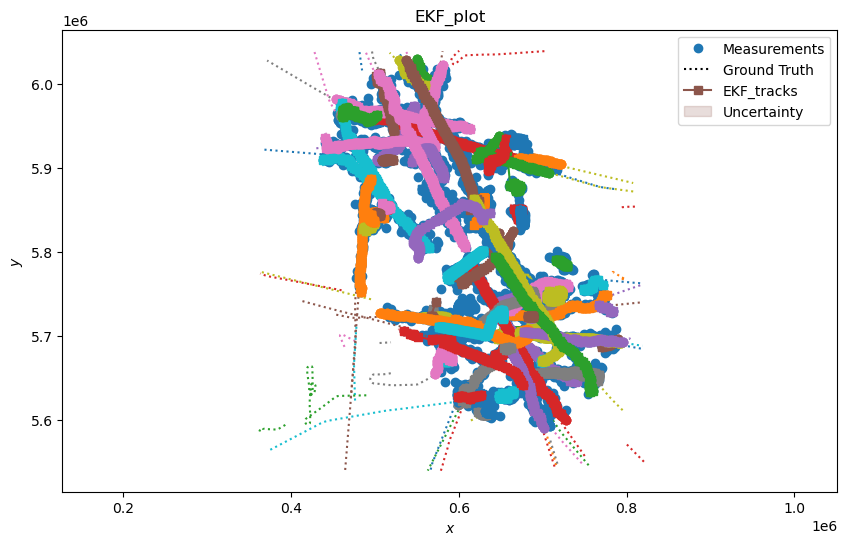

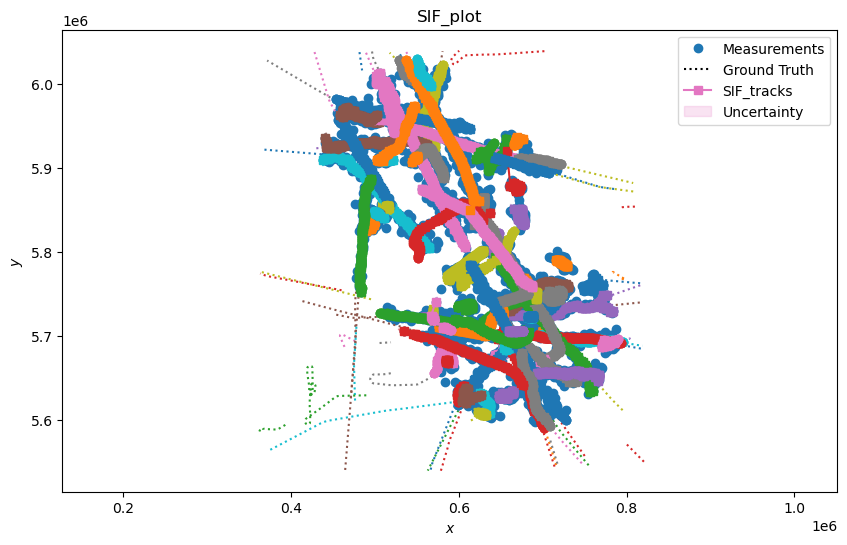

In [13]:
metrics = metric_manager.generate_metrics()

In [14]:
for generator in metrics.keys():
    if 'basic' in generator:
        print(f'\n{generator}:')
        for metric_key, metric in metrics[generator].items():
            print(f"{metric.title}: {metric.value}")


basic_EKF:
Number of targets: 84
Number of tracks: 82
Track-to-target ratio: 0.9761904761904762

basic_SIF:
Number of targets: 84
Number of tracks: 83
Track-to-target ratio: 0.9880952380952381


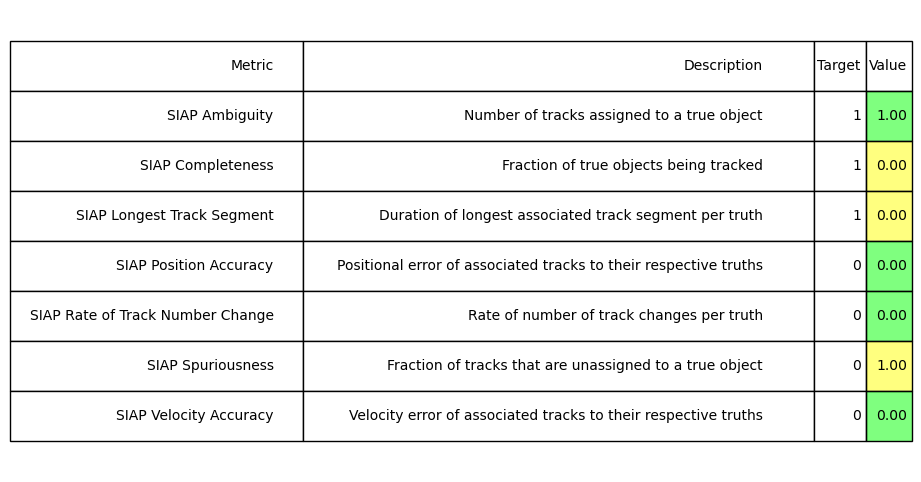

In [15]:
from stonesoup.metricgenerator.metrictables import SIAPTableGenerator

siap_metrics = metrics['SIAP_EKF-truth']
siap_averages_EKF = {siap_metrics.get(metric) for metric in siap_metrics
                     if metric.startswith("SIAP") and not metric.endswith(" at times")}
siap_table = SIAPTableGenerator(siap_averages_EKF).compute_metric()

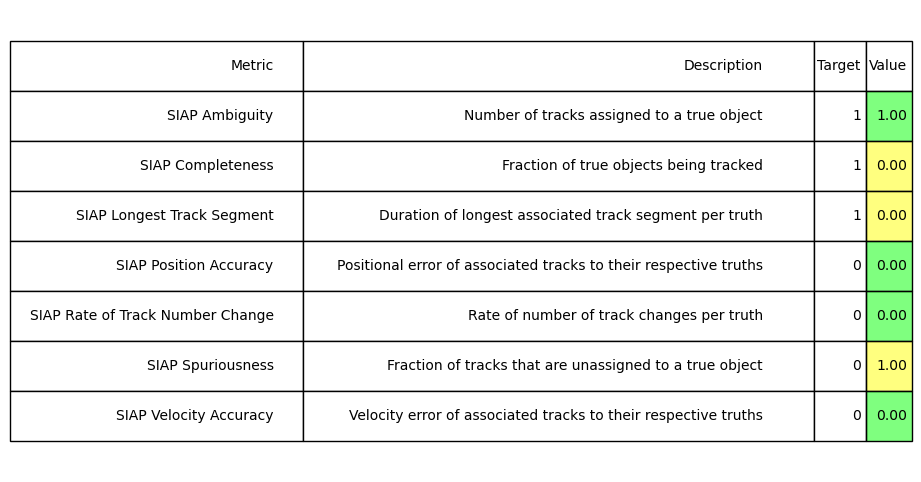

In [16]:
from stonesoup.metricgenerator.metrictables import SIAPTableGenerator

siap_metrics = metrics['SIAP_SIF-truth']
siap_averages_SIF = {siap_metrics.get(metric) for metric in siap_metrics
                     if metric.startswith("SIAP") and not metric.endswith(" at times")}
siap_table = SIAPTableGenerator(siap_averages_SIF).compute_metric()

C:\Users\echo4\AppData\Local\Temp\ipykernel_33052\3213036068.py:15: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



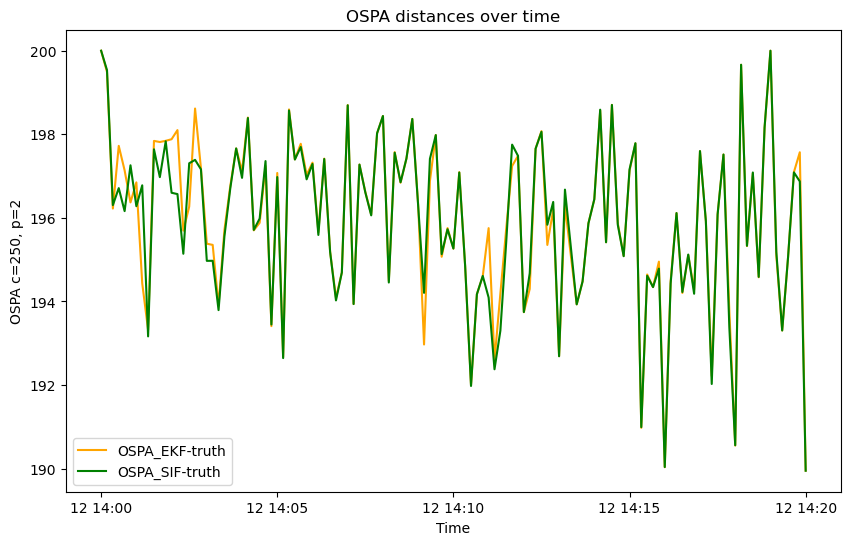

In [17]:
from stonesoup.plotter import MetricPlotter

graph = MetricPlotter()
graph.plot_metrics(metrics, generator_names=['OSPA_EKF-truth',
                                             #'SIAP_EKF-truth',
                                             'OSPA_SIF-truth'],
                                             #'SIAP_SIF-truth'],
                   # metric_names=['OSPA distances',
                   #               'SIAP Position Accuracy at times']
                   # uncomment and run to see effect
                   color=['orange', 'green'])

# update y-axis label and title; other subplots are displaying auto-generated title and labels
graph.axes[0].set(ylabel='OSPA c=250, p=2', title='OSPA distances over time')
graph.fig.show()

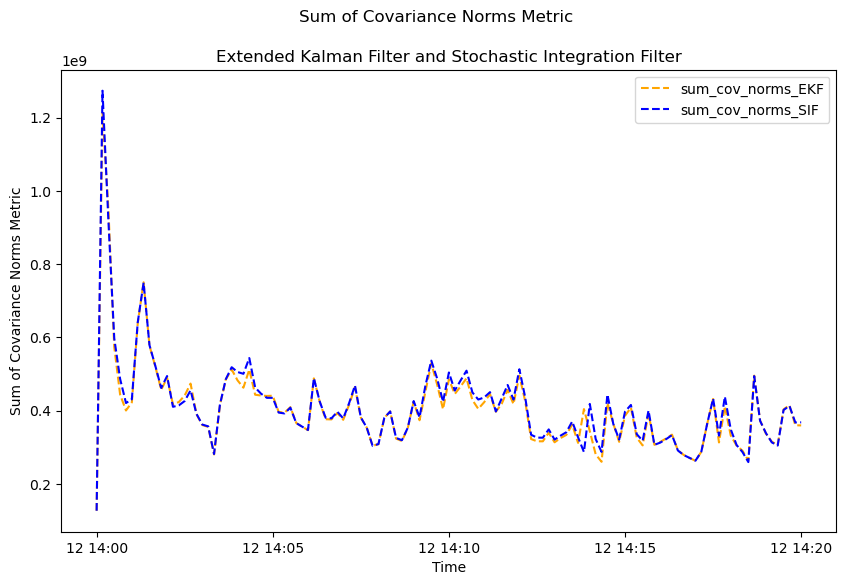

In [18]:
graph = MetricPlotter()
graph.plot_metrics(metrics, generator_names=['sum_cov_norms_EKF',
                                             'sum_cov_norms_SIF'],
                   combine_plots=True,
                   color=['orange', 'blue'], linestyle='--')
graph.set_fig_title('Sum of Covariance Norms Metric')  # set figure title
graph.set_ax_title(['Extended Kalman Filter and Stochastic Integration Filter'])  # set title for each axis

## References
.. [#] The OpenSky Network, http://www.opensky-network.org
.. [#] Bringing up OpenSky: A large-scale ADS-B sensor network for research
   Matthias Schäfer, Martin Strohmeier, Vincent Lenders, Ivan Martinovic, Matthias Wilhelm
   ACM/IEEE International Conference on Information Processing in Sensor Networks, April 2014
.. [#images] Radar and Plane icons provided by http://simpleicon.com/

